## Tic-Tac-Toe Agent
​
In this notebook, you will learn to build an RL agent (using Q-learning) that learns to play Numerical Tic-Tac-Toe with odd numbers. The environment is playing randomly with the agent, i.e. its strategy is to put an even number randomly in an empty cell. The following is the layout of the notebook:
        - Defining epsilon-greedy strategy
        - Tracking state-action pairs for convergence
        - Define hyperparameters for the Q-learning algorithm
        - Generating episode and applying Q-update equation
        - Checking convergence in Q-values

#### Importing libraries
Write the code to import Tic-Tac-Toe class from the environment file

In [1]:
# ! pip install gym 

In [2]:
# from <TC_Env> import <TicTacToe> - import your class from environment file
from TCGame_Env1 import TicTacToe
import collections
import numpy as np
import random
import pickle
import time
from matplotlib import pyplot as plt

In [3]:
# Function to convert state array into a string to store it as keys in the dictionary
# states in Q-dictionary will be of form: x-4-5-3-8-x-x-x-x
#   x | 4 | 5
#   ----------
#   3 | 8 | x
#   ----------
#   x | x | x

def Q_state(state):

    return ('-'.join(str(e) for e in state)).replace('nan','x')

In [4]:
# Defining a function which will return valid (all possible actions) actions corresponding to a state
# Important to avoid errors during deployment.

def valid_actions(state):

    valid_Actions = []
    valid_Actions = [i for i in env.action_space(state)[0]] ###### -------please call your environment as env
    return valid_Actions

In [5]:
# Defining a function which will add new Q-values to the Q-dictionary. 
def add_to_dict(state):
    state1 = Q_state(state)
    
    valid_act = valid_actions(state)
    if state1 not in Q_dict.keys():
        for action in valid_act:
            Q_dict[state1][action]=0

#### Epsilon-greedy strategy - Write your code here

(you can build your epsilon-decay function similar to the one given at the end of the notebook)

### Epsilon - decay check

In [6]:
max_epsilon = 1.0
min_epsilon = 0.001
time = np.arange(0,5000000)
epsilon = []
for i in range(0,5000000):
    epsilon.append(min_epsilon + (max_epsilon - min_epsilon) * np.exp(-0.000001*i))

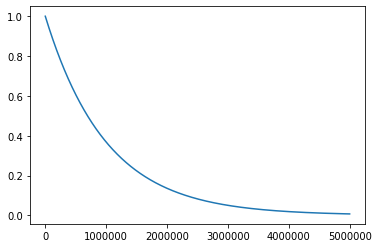

In [7]:
plt.plot(time, epsilon)
plt.show()

In [8]:
# Defining epsilon-greedy policy. You can choose any function epsilon-decay strategy
def epsilon_greedy(state, available_actions):
    
    #epsilon_index = epsilon[episode]
    epsilon_index = 0.3
    random_number = np.random.random()
    
    if random_number < epsilon_index:      #exploration
        #print("Exploration")
        action = random.choice(available_actions)
        return action
    else:                             #greedy strategy
        Q_list=[]
        #print("Exploitation")
        for action in available_actions:
            Q_list.append(Q_dict[state][action])
        max_value = max(Q_list)

        if Q_list.count(max_value) > 1:
            # choose the best among the available options
            best_options = [i for i in range(len(available_actions)) if Q_list[i] == max_value]
            i = random.choice(best_options)
        else:
            i = Q_list.index(max_value)

        return available_actions[i]


#### Tracking the state-action pairs for checking convergence - write your code here

In [9]:
# Initialise Q_dictionary as 'Q_dict' and States_tracked as 'States_track' (for convergence)
Q_dict = collections.defaultdict(dict)

States_track = collections.defaultdict(dict)

rewards_tracked = {Q_state(np.array([9, 2, 7, np.nan, 8, 6, 4, 3, 5])):[],Q_state(np.array([np.nan, 5, 1, 2, 8, 9, 7, 6, 4])):[], Q_state((np.array([np.nan, 4, 2, np.nan, 5, 3, np.nan, np.nan, np.nan]))): [], Q_state((np.array([1, np.nan, 3, np.nan, np.nan, np.nan, np.nan, 8, np.nan]))):[], Q_state((np.array([8, 6, 4, np.nan, 5, 7, 1, 2, 9]))):[]}

In [10]:
# Initialise states to be tracked
def initialise_tracking_states():
    # select any 5 Q-values
    sample_q_values = [(np.array([9,2, 7, np.nan, 8, 6, 4, 3, 5]),(3,1)),(np.array([np.nan, 5, 1, 2, 8, 9, 7, 6, 4]),(0,3)),(np.array([np.nan, 4, 2, np.nan, 5, 3, np.nan, np.nan, np.nan]),(3,7)),(np.array([1, 3, np.nan, np.nan, 8, 6, np.nan, 9, 4]),(2,5)),(np.array([8, 6, 4, np.nan, 5, 7, 1, 2, 9]),(3,3))]
    for q_values in sample_q_values:
        state = Q_state(q_values[0])
        action = q_values[1]
        States_track[state][action] = []    #this is an array which will have appended values of that state-action pair for every 2000th episode         
  

In [11]:
#Defining a function to save the Q-dictionary as a pickle file

def save_obj(obj, name ):
    with open(name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

In [12]:
def save_tracking_states():
    for state in States_track.keys():
        for action in States_track[state].keys():
            if state in Q_dict and action in Q_dict[state]:
                States_track[state][action].append(Q_dict[state][action])

In [13]:
initialise_tracking_states()
States_track

defaultdict(dict,
            {'9.0-2.0-7.0-x-8.0-6.0-4.0-3.0-5.0': {(3, 1): []},
             'x-5.0-1.0-2.0-8.0-9.0-7.0-6.0-4.0': {(0, 3): []},
             'x-4.0-2.0-x-5.0-3.0-x-x-x': {(3, 7): []},
             'x-5.0-7.0-2.0-6.0-1.0-4.0-9.0-8.0': {(0, 3): []},
             '8.0-6.0-4.0-x-5.0-7.0-1.0-2.0-9.0': {(3, 3): []}})

#### Define hyperparameters  ---write your code here

In [14]:
EPISODES = 50000

# Hyperparameters
 
LR = 0.3                    # learning rate
GAMMA = 0.90                # discount factor


threshold = 2000     #every these many episodes, the 4 Q-values will be stored/appended (convergence graphs)

policy_threshold = 3000  #every these many episodes, the Q-dict will be updated


### Q-update loop ---write your code here

In [15]:
count_of_agent_wins = 0
count_of_env_wins = 0
count_of_tie = 0

for episode in range(EPISODES):
    ##### Start writing your code from the next line
    print("------------------------------------------------------------------------------------------------")
    print("Episode Count :",episode+1)
    
    # Initialising values 
    completed = False        # game status at the start of the game
    total_reward = 0
    
    # Create instance of the game
    env = TicTacToe()      
    
    initial_state = env.reset()   # Launch of new game
    curr_state = initial_state 
        
    # Update Q_dict with the current state 
    add_to_dict(curr_state)
    
    # Agent's first move as agent always makes the first move
    curr_action = random.choice(valid_actions(curr_state))
    #print("AGENT'S FIRST MOVE : current state ->",curr_state,",current action ->",curr_action)

    curr_state = env.state_transition(curr_state, curr_action)

    # add agent's state to Q dict
    add_to_dict(curr_state)
    #print("added to dict:curr_state:",agent_state,"curr_action:",curr_action)

    # Environment's move
    next_state, reward , completed = env.step(curr_state, curr_action)

    # add environment's state to Q dict
    add_to_dict(next_state)
    
    total_reward += reward       # Compute the total rewards from first state transition
    
    while completed == False:    # the episode will run until the game ends with a win or a tie
                
        # keeping a copy of the state
        update_state = curr_state.copy()
        
        # using epsilon greedy strategy
        curr_action = epsilon_greedy(Q_state(curr_state),valid_actions(curr_state))
        #print("AGENT MOVE: current state ->",curr_state,",E-greedy current action ->",curr_action)
        
        # Agent's move
        # Agent always makes the first move
        curr_state = env.state_transition(curr_state, curr_action)
        
        # add agent's state to Q dict
        add_to_dict(curr_state)
        #print("added to dict:curr_state:",agent_state,"curr_action:",curr_action)
        
        # Environment's move
        next_state, reward , completed = env.step(curr_state, curr_action)
        
        # add environment's state to Q dict
        add_to_dict(next_state)
        #print("added to dict:next_state:",next_state,"curr_action:",curr_action)
        
        total_reward += reward   # Compute the total rewards from each state transition
        
    #        ---------------------------UPDATE Q VALUE----------------------------
        if completed == False:
            # non terminal position
            max_next = max(Q_dict[Q_state(next_state)],key=Q_dict[Q_state(next_state)].get) 
            Q_dict[Q_state(update_state)][curr_action] += LR * ((reward + (GAMMA*(Q_dict[Q_state(next_state)][max_next]))) - Q_dict[Q_state(update_state)][curr_action] ) 
            update_state = next_state       # Updating the state
        else:
            # terminal position
            Q_dict[Q_state(update_state)][curr_action] += LR * ((reward + (GAMMA*(0.0))) - Q_dict[Q_state(update_state)][curr_action] ) 
            if reward > 1:
                count_of_agent_wins = count_of_agent_wins + 1
            elif reward < -10:
                count_of_env_wins = count_of_env_wins + 1
            else:
                count_of_tie = count_of_tie + 1
            break

    # Total rewards from the episode          
    print("Total reward :",total_reward)

    
    #TRACKING REWARDS
    if Q_state(initial_state) in rewards_tracked:     #storing rewards
        rewards_tracked[Q_state(initial_state)].append(total_reward)

    if ((episode+1) % threshold) == 0:   
        save_obj(rewards_tracked,'Rewards')   
    
    #TRACKING Q-VALUES
    if (episode == threshold-1):        
        initialise_tracking_states()
      
    if ((episode+1) % threshold) == 0:   
        save_tracking_states()
        save_obj(States_track,'States_tracked')   
    
    #SAVING POLICY
    if ((episode+1)% policy_threshold ) == 0:  
        save_obj(Q_dict,'Policy')    


------------------------------------------------------------------------------------------------
Episode Count : 1
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 5
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6
$$$   Game over. Agent wins!
Total reward : 6
------------------------------

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 52
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 53
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 54
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 55
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 56
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 57
$$$   Game over. A

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 104
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 105
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 106
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 107
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 108
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 109
$$$   Game o

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 162
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 163
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 164
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 165
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 166
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 167
$$$   Game ove

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 231
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 232
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 233
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 234
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 235
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 236
$$$   Game ove

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 305
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 306
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 307
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 308
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 309
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 310
$$$   Game over.

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 362
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 363
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 364
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 365
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 366
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 367
$$$   Game o

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 422
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 423
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 424
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 425
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 426
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 427
$$$   Game ove

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 479
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 480
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 481
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 482
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 483
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 484
$$$   Game

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 549
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 550
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 551
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 552
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 553
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 554
$$$   Game ove

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 615
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 616
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 617
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 618
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 619
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 620
$$$   Game o

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 665
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 666
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 667
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 668
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 669
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 670
$$$   Game o

Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 727
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 728
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 729
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 730
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 731
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 732
$$$   Game over. It is a tie!
Total rew

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 782
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 783
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 784
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 785
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 786
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 787
$$$   Game ove

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 852
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 853
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 854
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 855
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 856
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 857
$$$   Game ove

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 924
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 925
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 926
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 927
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 928
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 929
$$$   Game

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 974
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 975
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 976
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 977
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 978
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 979
$$$   Game ove

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 1032
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1033
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1034
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 1035
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1036
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1037
$$$   

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 1098
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 1099
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1100
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1101
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1102
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 1103
$$$   Ga

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 1152
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 1153
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1154
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1155
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 1156
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 1157
$$$   Game

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 1207
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1208
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1209
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 1210
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 1211
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1212
$$$   Game

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1279
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1280
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 1281
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 1282
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1283
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1284
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1337
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1338
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1339
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1340
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1341
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1342
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1391
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 1392
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1393
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1394
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 1395
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1396
$$$   Ga

Episode Count : 1448
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 1449
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1450
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1451
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 1452
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1453
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episod

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1511
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 1512
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1513
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1514
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1515
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1516
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1576
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1577
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1578
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 1579
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1580
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1581
$$$ 

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 1642
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1643
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1644
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1645
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 1646
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 1647
$$$   Ga

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1712
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1713
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1714
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1715
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1716
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 1717
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1778
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1779
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1780
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1781
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 1782
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1783
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1841
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1842
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1843
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1844
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1845
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1846
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1903
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1904
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1905
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1906
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1907
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1908
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1962
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1963
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 1964
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1965
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1966
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1967
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2035
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2036
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2037
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 2038
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 2039
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 2040
$$$   Game

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2101
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 2102
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2103
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2104
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 2105
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2106
$$$   

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2177
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2178
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 2179
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 2180
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2181
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2182
$$$   Ga

Episode Count : 2237
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2238
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2239
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2240
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 2241
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2242
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Epis

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2292
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2293
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2294
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2295
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2296
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2297
$$$   Game over. Agent lost!
Total r

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2354
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2355
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2356
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2357
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2358
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2359
$$$   

Episode Count : 2415
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2416
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2417
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2418
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2419
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2420
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Epis

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2474
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2475
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 2476
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2477
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2478
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2479
$$$   Game o

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2545
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2546
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2547
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2548
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2549
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2550
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2610
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 2611
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2612
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2613
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 2614
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 2615
$$$   Game

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2664
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2665
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 2666
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 2667
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2668
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2669
$$$   Game over. Agent lost!
Total rew

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2735
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2736
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 2737
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 2738
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2739
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2740
$$$   Ga

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2802
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2803
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2804
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2805
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2806
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2807
$$$   Ga

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2863
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2864
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 2865
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2866
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2867
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2868
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2934
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 2935
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2936
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 2937
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 2938
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2939
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2987
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2988
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 2989
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 2990
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2991
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2992
$$$   Game

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3063
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3064
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3065
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3066
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3067
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3068
$$$   

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3122
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3123
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3124
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3125
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 3126
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3127
$$$   Ga

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 3178
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3179
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3180
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3181
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3182
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3183
$$$   

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3232
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3233
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 3234
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 3235
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 3236
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3237
$$$   Game o

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3283
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 3284
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3285
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3286
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3287
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3288
$$$   Game

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3336
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3337
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3338
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3339
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3340
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3341
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3395
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3396
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3397
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3398
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3399
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3400
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3459
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3460
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 3461
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3462
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3463
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3464
$$$   

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3526
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3527
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3528
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3529
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3530
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3531
$$$   Ga

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3588
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 3589
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3590
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3591
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3592
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 3593
$$$   Game o

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3658
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3659
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3660
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3661
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3662
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3663
$$$ 

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3714
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3715
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3716
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 3717
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 3718
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3719
$$$   Game over. Agent lost!
Total rew

Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3779
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3780
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 3781
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3782
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3783
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3784
$$$   Game over. Agent wins!
Total rewa

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3842
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3843
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 3844
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3845
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3846
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3847
$$$   Ga

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 3920
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3921
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 3922
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3923
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3924
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3925
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3992
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3993
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3994
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3995
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3996
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3997
$$$ 

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 4073
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4074
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4075
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4076
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4077
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4078
$$$   

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4144
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 4145
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4146
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4147
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4148
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4149
$$$   Ga

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 4207
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4208
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4209
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4210
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4211
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4212
$$$   

$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 4271
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4272
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4273
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4274
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4275
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4276
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4342
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4343
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4344
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4345
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4346
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4347
$$$   

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 4418
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 4419
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 4420
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4421
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 4422
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4423
$$$   Game o

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4483
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4484
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4485
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 4486
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4487
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4488
$$$   Game over. It is a tie!
Total rewa

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4539
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4540
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4541
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4542
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 4543
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 4544
$$$   Game

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4609
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4610
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4611
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4612
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4613
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4614
$$$   

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4675
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4676
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4677
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4678
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4679
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4680
$$$ 

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 4736
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4737
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4738
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4739
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4740
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4741
$$$   Game o

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4795
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4796
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 4797
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4798
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4799
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4800
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4849
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4850
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4851
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4852
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4853
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4854
$$$ 

Episode Count : 4912
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4913
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4914
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 4915
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 4916
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4917
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4970
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4971
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 4972
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4973
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 4974
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4975
$$$   Game

------------------------------------------------------------------------------------------------
Episode Count : 5033
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5034
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5035
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5036
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 5037
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5038
$$$   Game over. Agent wins!
Total reward : 5
------

Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5086
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5087
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5088
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5089
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5090
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5091
$$$   Game over. Agent lost!
Tota

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5158
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 5159
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5160
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5161
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5162
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5163
$$$   

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 5242
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5243
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5244
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 5245
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5246
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5247
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5307
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5308
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5309
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5310
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 5311
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 5312
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5364
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5365
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5366
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 5367
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5368
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 5369
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5433
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5434
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5435
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 5436
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5437
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5438
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5503
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5504
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5505
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5506
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5507
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5508
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5554
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5555
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5556
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5557
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 5558
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5559
$$$   

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 5611
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5612
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5613
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 5614
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 5615
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 5616
$$$   Game

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5677
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 5678
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5679
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 5680
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5681
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 5682
$$$   

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 5734
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 5735
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5736
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 5737
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 5738
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5739
$$$   Game

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 5791
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5792
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 5793
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5794
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 5795
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5796
$$$   Ga

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 5860
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5861
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5862
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5863
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5864
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 5865
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5921
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5922
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5923
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 5924
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5925
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 5926
$$$   

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 5993
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 5994
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5995
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5996
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 5997
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 5998
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6049
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6050
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6051
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6052
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6053
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6054
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6118
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6119
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 6120
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6121
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6122
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6123
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6179
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 6180
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6181
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6182
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6183
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 6184
$$$   

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6248
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 6249
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6250
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 6251
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 6252
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6253
$$$   Ga

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6316
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 6317
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6318
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 6319
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 6320
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 6321
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6374
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6375
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6376
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6377
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6378
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6379
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6438
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6439
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6440
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 6441
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 6442
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 6443
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6501
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6502
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 6503
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6504
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6505
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6506
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6589
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 6590
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6591
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6592
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6593
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 6594
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6648
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6649
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 6650
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6651
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 6652
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6653
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6707
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 6708
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 6709
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6710
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6711
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6712
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6779
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6780
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6781
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6782
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6783
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 6784
$$$   Game o

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6839
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6840
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6841
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6842
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 6843
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 6844
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6900
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 6901
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6902
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 6903
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 6904
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6905
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6973
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 6974
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6975
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6976
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 6977
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 6978
$$$   

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7029
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 7030
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 7031
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7032
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 7033
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7034
$$$   Ga

Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 7097
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7098
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7099
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7100
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7101
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7102
$$$   Game over. Agent wins!
Total 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7166
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7167
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7168
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7169
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7170
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7171
$$$ 

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 7227
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7228
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 7229
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 7230
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7231
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 7232
$$$   Game

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 7278
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 7279
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 7280
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7281
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 7282
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7283
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7334
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 7335
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7336
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7337
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7338
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7339
$$$   

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7404
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 7405
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 7406
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7407
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7408
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 7409
$$$   Ga

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 7456
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 7457
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7458
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7459
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7460
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7461
$$$   

Episode Count : 7522
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7523
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7524
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 7525
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7526
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7527
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episod

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7583
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 7584
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 7585
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7586
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7587
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7588
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7640
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 7641
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7642
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 7643
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 7644
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7645
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7696
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7697
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 7698
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 7699
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7700
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7701
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7754
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7755
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7756
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 7757
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 7758
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7759
$$$   

------------------------------------------------------------------------------------------------
Episode Count : 7820
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7821
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7822
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 7823
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7824
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 7825
$$$   Game over. Agent lost!
Total reward : -13
--------

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7878
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 7879
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7880
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7881
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7882
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7883
$$$   

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 7941
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 7942
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7943
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7944
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 7945
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 7946
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8002
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8003
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 8004
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8005
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8006
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8007
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8065
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8066
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8067
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8068
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8069
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8070
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8135
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8136
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8137
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8138
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8139
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8140
$$$ 

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8199
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 8200
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 8201
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8202
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8203
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8204
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8266
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8267
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 8268
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 8269
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8270
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8271
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8322
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8323
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8324
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8325
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8326
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 8327
$$$ 

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 8386
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8387
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8388
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 8389
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 8390
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 8391
$$$   Game

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 8452
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8453
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8454
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 8455
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 8456
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 8457
$$$   

Episode Count : 8512
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8513
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 8514
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8515
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8516
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 8517
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8571
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 8572
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8573
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8574
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8575
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 8576
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8632
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8633
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 8634
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8635
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 8636
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 8637
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8689
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 8690
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8691
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 8692
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8693
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8694
$$$   

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 8741
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8742
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8743
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 8744
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 8745
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 8746
$$$   Ga

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 8807
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 8808
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 8809
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8810
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 8811
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8812
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8871
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8872
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 8873
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 8874
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8875
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 8876
$$$   

Episode Count : 8935
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8936
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 8937
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 8938
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 8939
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 8940
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Co

------------------------------------------------------------------------------------------------
Episode Count : 9001
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9002
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9003
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9004
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9005
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9006
$$$   Game over. Agent wins!
Total reward : 5
------

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 9056
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 9057
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9058
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9059
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 9060
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 9061
$$$   Ga

Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 9114
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9115
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9116
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9117
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 9118
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9119
$$$   Game over. Agent wins!
Total re

Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9177
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 9178
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9179
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 9180
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9181
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9182
$$$   Game over. It is a tie!
Total

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9242
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9243
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9244
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 9245
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 9246
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 9247
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9307
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 9308
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9309
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9310
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 9311
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9312
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9368
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9369
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9370
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9371
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 9372
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9373
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9422
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9423
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 9424
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9425
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 9426
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9427
$$$   

Episode Count : 9482
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 9483
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 9484
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9485
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 9486
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 9487
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode 

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 9545
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 9546
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 9547
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9548
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9549
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 9550
$$$   Ga

Episode Count : 9613
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9614
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 9615
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9616
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 9617
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9618
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9670
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9671
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9672
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9673
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 9674
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 9675
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9737
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 9738
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9739
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 9740
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9741
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 9742
$$$   Ga

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9796
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9797
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9798
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 9799
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 9800
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 9801
$$$   

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 9857
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 9858
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 9859
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9860
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9861
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9862
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9924
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9925
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 9926
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 9927
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 9928
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9929
$$$   Ga

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 9984
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 9985
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9986
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9987
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9988
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 9989
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10036
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10037
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10038
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10039
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10040
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10041


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10093
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10094
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10095
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10096
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10097
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10098
$$$   

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 10157
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 10158
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10159
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 10160
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10161
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10162
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10214
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10215
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10216
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10217
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10218
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 10219


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10281
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 10282
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10283
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10284
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10285
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10286
$$$ 

Episode Count : 10336
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10337
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10338
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10339
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10340
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10341
$$$   Game over. It is a tie!
Total reward : -5
-----------------------------------------------------------------------------------------------

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10407
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10408
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10409
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10410
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10411
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10412
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 10467
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10468
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10469
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 10470
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10471
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 1047

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10536
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10537
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10538
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 10539
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10540
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 10541
$$$   Game over. It is a tie!


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10607
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10608
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 10609
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10610
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10611
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10612
$$$   Ga

Episode Count : 10657
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 10658
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10659
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10660
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10661
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 10662
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Ep

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 10716
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 10717
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 10718
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10719
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10720
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10721
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10782
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10783
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10784
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 10785
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10786
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 10787
$$$ 

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 10840
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10841
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 10842
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 10843
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 10844
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10845
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 10901
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 10902
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10903
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10904
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10905
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10906
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10967
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 10968
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 10969
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 10970
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 10971
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 10972


$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 11029
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 11030
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 11031
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11032
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11033
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 11034
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11089
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11090
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11091
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 11092
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11093
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1109

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11151
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 11152
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11153
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11154
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 11155
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11156


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11215
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11216
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11217
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11218
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 11219
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11220


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 11282
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11283
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11284
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11285
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11286
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11287
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11348
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11349
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11350
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11351
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 11352
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11353
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11405
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 11406
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11407
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 11408
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11409
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11410
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11466
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11467
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11468
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11469
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11470
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11471
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11534
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11535
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11536
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11537
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11538
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 11539
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11605
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11606
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11607
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 11608
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 11609
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11610
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 11657
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11658
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11659
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11660
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11661
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11662


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11712
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11713
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11714
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 11715
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11716
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 11717


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11769
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 11770
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11771
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11772
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11773
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11774
$$

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11836
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11837
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11838
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11839
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11840
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11841
$$$   Game over. It is a tie!


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11897
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 11898
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 11899
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11900
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11901
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11902


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11969
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11970
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 11971
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 11972
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 11973
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 11974
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 12033
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12034
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 12035
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12036
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12037
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12038
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12089
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 12090
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12091
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 12092
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12093
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12094
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12158
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12159
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12160
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12161
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12162
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 12163
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12224
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12225
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12226
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12227
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 12228
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12229
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12282
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12283
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12284
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12285
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 12286
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1228

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12350
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 12351
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 12352
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12353
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12354
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12355


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12410
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12411
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12412
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12413
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12414
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 12415
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12463
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12464
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12465
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12466
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12467
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12468


Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12527
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12528
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12529
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 12530
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12531
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 12532
$$$   Game over. Agent lost!
Tota

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12592
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12593
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12594
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12595
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12596
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12597


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 12647
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12648
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 12649
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12650
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12651
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1265

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12724
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 12725
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 12726
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12727
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12728
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 12729


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12785
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12786
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12787
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12788
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12789
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12790
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 12873
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12874
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12875
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 12876
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 12877
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 12878


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 12940
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 12941
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 12942
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 12943
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 12944
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 12945


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 12999
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13000
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 13001
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13002
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13003
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13004


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13062
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13063
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13064
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13065
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13066
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13067


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13148
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13149
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13150
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13151
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13152
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 13153


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13199
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13200
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13201
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 13202
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13203
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 13204
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13254
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 13255
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 13256
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 13257
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13258
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13259
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13315
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 13316
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13317
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13318
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13319
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 13320


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13374
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13375
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13376
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13377
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13378
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13379


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13443
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13444
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13445
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13446
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13447
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13448
$$

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13505
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13506
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13507
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13508
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13509
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 13510
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13559
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13560
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13561
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13562
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13563
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13564


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13616
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13617
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 13618
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13619
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13620
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13621
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13676
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 13677
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13678
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13679
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13680
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13681


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 13744
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13745
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13746
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13747
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13748
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13749
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13803
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 13804
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 13805
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 13806
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13807
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13808
$$$   Ga

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13863
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13864
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13865
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13866
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13867
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 13868
$$$ 

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 13928
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13929
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13930
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13931
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13932
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 13933
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 13996
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 13997
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 13998
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 13999
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14000
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14001


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14064
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14065
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14066
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14067
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14068
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1406

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14122
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14123
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 14124
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14125
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14126
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14127


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14175
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14176
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14177
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14178
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14179
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 1418

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14255
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14256
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14257
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14258
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14259
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1426

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14321
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14322
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14323
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14324
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14325
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 14326


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14384
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14385
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14386
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14387
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14388
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 14389


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14444
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 14445
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14446
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14447
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14448
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14449


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14504
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14505
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14506
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14507
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14508
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1450

------------------------------------------------------------------------------------------------
Episode Count : 14559
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14560
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14561
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14562
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 14563
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14564
$$$   Game over. It is a tie!
Total reward : -5


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14614
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14615
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14616
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14617
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14618
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 14619


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14678
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 14679
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14680
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 14681
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14682
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14683


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14732
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14733
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14734
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14735
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14736
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1473

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 14788
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14789
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 14790
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 14791
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14792
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 14793
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14852
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14853
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14854
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14855
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 14856
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 14857


Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14903
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 14904
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14905
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14906
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 14907
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14908
$$$   Game over. Agent wins!
Tot

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14976
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14977
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 14978
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14979
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 14980
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 14981


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15030
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15031
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15032
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 15033
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15034
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 15035
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15088
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15089
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15090
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15091
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15092
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 15093


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15146
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 15147
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15148
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15149
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 15150
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15151
$$$ 

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 15196
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15197
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15198
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15199
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 15200
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15201
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15251
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15252
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 15253
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15254
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15255
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 15256
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15305
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 15306
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15307
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15308
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15309
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 15310
$$$   

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15364
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15365
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15366
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15367
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15368
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15369


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15414
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15415
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15416
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15417
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 15418
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15419
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15474
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 15475
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15476
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15477
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15478
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 15479
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15549
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15550
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15551
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15552
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15553
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15554
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15604
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15605
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 15606
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 15607
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 15608
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15609


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15674
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15675
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15676
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15677
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15678
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1567

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15733
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 15734
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15735
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15736
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15737
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15738


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15788
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15789
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15790
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15791
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 15792
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 15793
$$

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15847
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 15848
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15849
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 15850
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15851
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15852
$$$   Game over. Agent wins!
Tot

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 15907
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15908
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15909
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15910
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15911
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 15912
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15972
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 15973
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15974
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 15975
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 15976
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 15977
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16031
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16032
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 16033
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 16034
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16035
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16036


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 16104
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16105
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16106
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 16107
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 16108
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 16109


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16156
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16157
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 16158
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16159
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 16160
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 16161
$$

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16220
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16221
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 16222
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16223
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 16224
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16225
$$$   Game over. Agent wins!

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16288
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 16289
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16290
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 16291
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 16292
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 16293


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 16348
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 16349
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16350
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16351
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 16352
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16353
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 16417
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 16418
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16419
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16420
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16421
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 16422
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16469
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 16470
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 16471
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16472
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 16473
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1647

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16531
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16532
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 16533
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 16534
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 16535
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16536
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16589
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 16590
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 16591
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 16592
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16593
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 16594


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 16651
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16652
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 16653
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16654
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 16655
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 16656
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 16713
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16714
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 16715
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16716
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16717
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 16718
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 16787
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16788
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16789
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16790
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16791
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1679

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 16843
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16844
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16845
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16846
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16847
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1684

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16894
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 16895
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16896
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16897
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 16898
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 16899


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16965
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16966
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 16967
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 16968
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 16969
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 1697

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17030
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17031
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17032
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17033
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 17034
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17035


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17092
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17093
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17094
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17095
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17096
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1709

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17157
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17158
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17159
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17160
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17161
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1716

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 17226
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17227
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 17228
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 17229
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17230
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 17231
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17282
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17283
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17284
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 17285
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17286
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17287


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 17374
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17375
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17376
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17377
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17378
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1737

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17426
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17427
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 17428
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17429
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 17430
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1743

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17482
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 17483
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 17484
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17485
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 17486
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17487
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17556
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 17557
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17558
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17559
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17560
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 17561


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17626
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 17627
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 17628
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 17629
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 17630
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 17631
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17686
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17687
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 17688
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17689
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 17690
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17691


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17749
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17750
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17751
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 17752
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17753
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17754


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17806
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 17807
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 17808
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 17809
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17810
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1781

Episode Count : 17864
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 17865
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17866
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17867
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17868
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17869
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Ep

Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 17916
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17917
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17918
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17919
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 17920
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17921
$$$   Game over. Agent lost!
To

$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 17974
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 17975
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 17976
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 17977
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 17978
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 17979


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18031
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18032
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18033
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18034
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 18035
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1803

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 18090
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 18091
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 18092
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 18093
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18094
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18095
$$

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 18147
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 18148
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 18149
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18150
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18151
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1815

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18200
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18201
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18202
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18203
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18204
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1820

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18270
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 18271
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18272
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 18273
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18274
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18275


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18340
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18341
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18342
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 18343
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18344
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 1834

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18397
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18398
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 18399
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 18400
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18401
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18402
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 18452
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 18453
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18454
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 18455
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 18456
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18457
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18519
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18520
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 18521
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18522
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18523
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18524


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18574
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18575
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18576
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18577
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18578
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1857

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 18649
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18650
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18651
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18652
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 18653
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 18654


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18710
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 18711
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18712
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18713
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 18714
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18715


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18775
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18776
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18777
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18778
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18779
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1878

Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 18838
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 18839
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18840
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18841
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 18842
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18843
$$$   Game over. Agent lost!
To

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18895
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18896
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18897
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18898
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18899
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1890

$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 18950
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18951
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18952
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 18953
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 18954
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 18955


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 19002
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 19003
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 19004
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 19005
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19006
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19007
$$$ 

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19072
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19073
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 19074
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19075
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19076
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 19077
$$$   Game over. Agent wins!
T

Episode Count : 19121
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19122
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19123
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 19124
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19125
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19126
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19176
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19177
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 19178
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 19179
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 19180
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 19181
$$

Episode Count : 19236
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19237
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19238
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 19239
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19240
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 19241
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 19301
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19302
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19303
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19304
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 19305
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19306


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19366
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19367
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 19368
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19369
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19370
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 1937

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 19420
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19421
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 19422
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 19423
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19424
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 19425
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19477
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 19478
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19479
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19480
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19481
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 19482
$$

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 19537
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19538
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19539
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19540
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 19541
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19542


Episode Count : 19591
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19592
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 19593
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 19594
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19595
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 19596
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Epis

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 19667
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 19668
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19669
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 19670
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19671
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 19672
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19735
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19736
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19737
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 19738
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19739
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 19740
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19806
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19807
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 19808
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19809
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19810
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 1981

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19856
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 19857
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19858
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19859
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19860
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 19861
$$$   Game over. Agent wins!

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 19918
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19919
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19920
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19921
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 19922
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19923
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 19972
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19973
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 19974
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 19975
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 19976
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 19977
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20025
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20026
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 20027
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 20028
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20029
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20030
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20088
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 20089
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20090
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20091
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 20092
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20093


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20151
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 20152
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 20153
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 20154
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20155
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20156
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20202
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 20203
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 20204
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 20205
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20206
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20207
$$

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 20255
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 20256
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 20257
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 20258
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20259
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20260
$$$ 

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20324
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20325
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 20326
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 20327
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20328
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20329
$$$   Game over. Agent wins!
T

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 20376
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20377
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 20378
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20379
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20380
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20381
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20433
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20434
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20435
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20436
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 20437
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20438


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20496
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20497
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 20498
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 20499
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 20500
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20501


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20555
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 20556
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 20557
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20558
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20559
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20560
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20616
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20617
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20618
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20619
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 20620
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20621


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20685
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 20686
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20687
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 20688
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20689
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20690


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20749
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20750
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 20751
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20752
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 20753
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20754
$$

------------------------------------------------------------------------------------------------
Episode Count : 20809
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 20810
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20811
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20812
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20813
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20814
$$$   Game over. It is a tie!
Total reward : -5


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 20864
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 20865
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 20866
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20867
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20868
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20869


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20917
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 20918
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 20919
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20920
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20921
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20922
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20969
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 20970
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20971
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 20972
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20973
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 20974


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 21031
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21032
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 21033
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21034
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 21035
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21036


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 21091
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21092
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 21093
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21094
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 21095
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 21096


Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21172
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 21173
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21174
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 21175
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21176
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21177
$$$   Game over. Agent lost!
Tot

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21237
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21238
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21239
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21240
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 21241
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 21242
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21306
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21307
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21308
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21309
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21310
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2131

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21380
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21381
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21382
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21383
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 21384
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 21385


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21452
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21453
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21454
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21455
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21456
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2145

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21506
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21507
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21508
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21509
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21510
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 2151

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21585
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 21586
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 21587
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 21588
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21589
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21590


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21654
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21655
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21656
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 21657
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 21658
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 2165

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21703
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 21704
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21705
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21706
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21707
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21708


Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21764
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21765
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 21766
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21767
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21768
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 21769
$$$   Game over. It is a tie!


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 21827
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21828
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 21829
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 21830
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21831
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21832
$$$ 

Episode Count : 21888
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 21889
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 21890
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 21891
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 21892
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 21893
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Epis

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21950
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 21951
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 21952
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 21953
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 21954
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 21955
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 22019
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 22020
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22021
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22022
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 22023
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22024
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22074
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 22075
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 22076
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22077
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22078
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2207

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22131
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 22132
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22133
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22134
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 22135
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2213

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 22183
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22184
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22185
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22186
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 22187
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22188
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22234
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22235
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22236
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22237
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22238
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2223

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22295
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22296
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22297
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22298
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 22299
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2230

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 22360
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22361
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 22362
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 22363
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22364
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 22365
$$$ 

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22421
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22422
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22423
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 22424
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22425
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 22426
$$$   Game over. It is a tie

------------------------------------------------------------------------------------------------
Episode Count : 22475
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22476
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22477
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22478
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22479
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 22480
$$$   Game over. It is a tie!
Total reward : -5


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 22534
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22535
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 22536
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 22537
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22538
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 22539
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22603
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22604
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22605
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22606
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 22607
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 22608


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 22666
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22667
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22668
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22669
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22670
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2267

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22716
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22717
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22718
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22719
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22720
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 2272

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22769
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 22770
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22771
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 22772
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22773
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22774


Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 22822
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22823
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22824
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 22825
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 22826
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22827
$$$   Game over. Agent lost!
Tota

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22877
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22878
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 22879
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22880
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 22881
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 22882
$$$ 

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 22934
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 22935
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22936
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22937
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 22938
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 22939


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23007
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23008
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23009
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 23010
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 23011
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23012
$$

Episode Count : 23066
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23067
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23068
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 23069
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23070
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23071
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Epis

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23127
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23128
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23129
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23130
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23131
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2313

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23197
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23198
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23199
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 23200
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23201
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2320

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23250
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 23251
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23252
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23253
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23254
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23255
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 23303
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23304
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23305
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23306
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23307
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23308


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23368
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23369
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23370
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23371
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23372
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23373


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23421
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23422
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23423
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23424
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23425
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2342

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23476
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23477
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23478
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23479
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23480
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23481


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23527
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23528
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23529
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 23530
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23531
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23532


Episode Count : 23581
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23582
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23583
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 23584
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23585
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23586
$$$   Game over. It is a tie!
Total reward : -5
-----------------------------------------------------------------------------------------------

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 23647
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23648
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23649
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 23650
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23651
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23652
$$$ 

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23707
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23708
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23709
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23710
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23711
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23712
$$$ 

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23775
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 23776
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23777
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23778
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23779
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2378

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23830
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23831
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23832
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23833
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23834
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2383

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23908
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 23909
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 23910
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23911
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23912
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 23913
$$$   

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 23969
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23970
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23971
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 23972
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 23973
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 23974
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24030
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24031
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24032
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24033
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 24034
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2403

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24087
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 24088
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24089
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24090
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24091
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24092
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24147
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24148
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24149
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24150
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24151
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24152
$$

Episode Count : 24208
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 24209
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 24210
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24211
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24212
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24213
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Ep

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24270
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24271
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24272
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 24273
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24274
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24275
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24330
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24331
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24332
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24333
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24334
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24335
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24391
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24392
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24393
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 24394
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24395
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 24396
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 24455
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24456
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24457
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 24458
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24459
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24460
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24524
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24525
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24526
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24527
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24528
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24529


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24584
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24585
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24586
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24587
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24588
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 24589
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24642
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24643
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 24644
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24645
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 24646
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24647


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24704
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24705
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24706
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24707
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 24708
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2470

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24757
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24758
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 24759
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24760
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24761
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 24762
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24824
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 24825
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24826
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24827
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 24828
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2482

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24889
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 24890
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24891
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24892
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 24893
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 2489

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 24965
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 24966
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 24967
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 24968
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24969
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 24970
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25025
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 25026
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 25027
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25028
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 25029
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25030
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25092
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25093
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 25094
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25095
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 25096
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25097
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25179
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25180
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 25181
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25182
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25183
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25184


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25230
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 25231
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25232
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 25233
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25234
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 2523

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 25290
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25291
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 25292
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25293
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25294
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25295
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25361
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25362
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25363
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25364
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25365
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 25366


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 25420
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 25421
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25422
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 25423
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25424
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 25425
$$$ 

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 25489
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25490
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25491
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25492
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25493
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2549

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25565
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25566
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25567
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 25568
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25569
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25570


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25626
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25627
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 25628
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 25629
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 25630
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 25631


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 25697
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25698
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 25699
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25700
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 25701
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 25702
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25770
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 25771
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25772
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25773
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25774
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2577

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 25833
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25834
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25835
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 25836
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25837
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 25838


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25904
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25905
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25906
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 25907
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 25908
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 2590

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 25968
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 25969
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 25970
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 25971
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 25972
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 25973
$$$ 

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26028
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 26029
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 26030
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 26031
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 26032
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26033
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26081
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 26082
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 26083
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 26084
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26085
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26086
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26151
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26152
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26153
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26154
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 26155
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26156
$$

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 26219
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26220
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26221
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26222
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 26223
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26224


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26292
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26293
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 26294
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26295
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26296
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26297
$$

------------------------------------------------------------------------------------------------
Episode Count : 26358
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 26359
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26360
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 26361
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26362
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 26363
$$$   Game over. Agent lost!
Total reward : -14


Episode Count : 26408
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 26409
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 26410
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26411
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26412
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26413
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------


Episode Count : 26471
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26472
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26473
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26474
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 26475
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 26476
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Ep

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26540
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26541
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 26542
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 26543
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26544
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26545
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26592
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 26593
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26594
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 26595
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26596
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 26597
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26651
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26652
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26653
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26654
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26655
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 26656
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26712
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26713
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26714
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26715
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26716
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26717


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26775
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 26776
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 26777
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26778
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 26779
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 26780
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26850
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26851
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 26852
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 26853
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 26854
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26855


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26914
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26915
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 26916
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 26917
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26918
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26919


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26969
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26970
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26971
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26972
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 26973
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 26974


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27028
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27029
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27030
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27031
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27032
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2703

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27097
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27098
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27099
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 27100
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 27101
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27102
$$$   Game over. Agent lost!
Tot

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27161
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27162
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27163
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 27164
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 27165
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27166
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27224
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27225
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 27226
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27227
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27228
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 27229
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27277
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 27278
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 27279
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27280
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 27281
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 27282
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 27335
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 27336
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 27337
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27338
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27339
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 27340
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27405
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 27406
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 27407
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27408
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27409
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2741

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 27489
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27490
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27491
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 27492
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 27493
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27494
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27560
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 27561
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 27562
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 27563
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27564
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 27565
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 27614
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 27615
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 27616
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 27617
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27618
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27619
$$$   

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27686
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27687
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27688
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27689
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27690
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2769

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27752
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27753
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 27754
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27755
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27756
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 27757


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27814
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 27815
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27816
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 27817
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27818
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27819


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 27884
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27885
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 27886
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 27887
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27888
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 27889
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27944
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27945
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27946
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 27947
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27948
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 27949


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28005
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 28006
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28007
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 28008
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 28009
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28010
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28076
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28077
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28078
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 28079
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 28080
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 28081


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28133
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28134
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28135
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 28136
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 28137
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28138
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28199
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 28200
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 28201
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28202
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28203
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2820

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28263
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28264
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 28265
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 28266
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28267
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 28268
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28322
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 28323
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28324
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28325
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 28326
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 2832

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28380
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 28381
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28382
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 28383
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28384
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28385
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 28435
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28436
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28437
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 28438
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 28439
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28440
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28493
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 28494
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28495
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28496
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28497
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2849

Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28561
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 28562
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 28563
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28564
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28565
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28566
$$$   Game over. Agent lost

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28631
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28632
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28633
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 28634
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 28635
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 28636
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28702
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28703
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28704
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28705
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28706
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 28707


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28752
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 28753
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28754
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28755
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 28756
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 28757


Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28824
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28825
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28826
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28827
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28828
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28829
$$$   Game over. It is a tie

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 28882
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 28883
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28884
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 28885
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 28886
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28887
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28935
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 28936
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28937
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 28938
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 28939
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 28940
$$

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 28999
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29000
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29001
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29002
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29003
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 29004
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 29074
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29075
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 29076
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29077
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29078
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 29079
$$

$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 29136
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29137
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 29138
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29139
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 29140
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 29141
$$

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 29199
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29200
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29201
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29202
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 29203
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 29204


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29259
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29260
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 29261
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29262
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29263
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29264


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 29328
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29329
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 29330
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29331
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 29332
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 29333
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29395
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29396
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 29397
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29398
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29399
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 29400
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29449
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29450
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29451
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 29452
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 29453
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 29454
$$

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 29515
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29516
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29517
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 29518
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29519
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29520


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29594
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29595
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29596
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29597
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29598
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 29599


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29644
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29645
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 29646
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29647
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 29648
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29649
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29709
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29710
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29711
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29712
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 29713
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2971

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 29780
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29781
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29782
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29783
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29784
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29785


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29836
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29837
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29838
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29839
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29840
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2984

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29902
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29903
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29904
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29905
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 29906
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29907


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29978
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29979
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29980
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 29981
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 29982
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 2998

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30056
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 30057
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30058
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 30059
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30060
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30061
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30115
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30116
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30117
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30118
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30119
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3012

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30171
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30172
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30173
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 30174
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30175
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30176


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30238
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30239
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30240
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 30241
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30242
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 30243
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30307
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30308
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30309
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30310
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30311
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 30312


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30365
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30366
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30367
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30368
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30369
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30370
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30424
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30425
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 30426
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30427
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30428
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30429


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30484
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30485
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 30486
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30487
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30488
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30489
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30544
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30545
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30546
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30547
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30548
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 30549
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30601
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30602
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30603
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30604
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 30605
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3060

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30663
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 30664
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30665
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30666
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 30667
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30668


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30733
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30734
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30735
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30736
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30737
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3073

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30801
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 30802
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30803
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30804
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30805
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30806
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30872
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30873
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 30874
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30875
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 30876
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 30877


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 30939
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30940
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30941
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30942
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 30943
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 30944


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31013
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 31014
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31015
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 31016
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31017
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 31018
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31083
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 31084
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31085
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 31086
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31087
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3108

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31156
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31157
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31158
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31159
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31160
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3116

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31235
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31236
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31237
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 31238
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31239
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31240


Episode Count : 31296
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31297
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31298
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31299
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31300
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31301
$$$   Game over. It is a tie!
Total reward : -5
-----------------------------------------------------------------------------------------------

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31365
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31366
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31367
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31368
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31369
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 31370


Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 31428
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 31429
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 31430
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31431
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 31432
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31433
$$$   Game over. It is a tie!
T

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 31499
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31500
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 31501
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31502
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31503
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31504


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31585
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 31586
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31587
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 31588
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31589
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 31590
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31656
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 31657
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 31658
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31659
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31660
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31661
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31712
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31713
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31714
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 31715
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31716
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 31717


Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 31772
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 31773
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31774
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 31775
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 31776
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31777
$$$   Game over. Agent lost!
Tota

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31839
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31840
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31841
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31842
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31843
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3184

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31903
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 31904
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 31905
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31906
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31907
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31908


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 31978
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 31979
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31980
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31981
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 31982
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 31983
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32044
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 32045
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32046
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32047
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32048
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3204

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 32105
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32106
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32107
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 32108
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32109
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 32110
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32179
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32180
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32181
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 32182
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32183
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3218

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32242
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 32243
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 32244
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32245
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32246
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32247


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32301
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32302
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32303
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 32304
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 32305
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32306


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32367
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32368
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32369
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32370
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32371
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3237

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32420
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32421
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32422
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 32423
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32424
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32425


Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32479
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 32480
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32481
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32482
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32483
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 32484
$$$   Game over. Agent lost!
To

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32535
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 32536
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 32537
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32538
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32539
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32540
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 32616
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 32617
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32618
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32619
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32620
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32621
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32674
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32675
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 32676
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 32677
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 32678
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 32679
$$$   

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32725
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 32726
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 32727
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 32728
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32729
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32730
$$$   Game over. Agent wins!
Tot

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32781
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32782
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 32783
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32784
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32785
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3278

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32830
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32831
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 32832
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32833
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32834
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3283

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32892
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 32893
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32894
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32895
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 32896
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3289

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32962
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 32963
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 32964
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 32965
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 32966
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 32967
$$

Episode Count : 33017
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33018
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 33019
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33020
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33021
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33022
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Ep

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33083
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 33084
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 33085
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 33086
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 33087
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 33088
$$$   

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 33151
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33152
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33153
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33154
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 33155
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33156
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33216
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33217
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33218
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33219
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33220
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3322

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33279
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33280
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 33281
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33282
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33283
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3328

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33329
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33330
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33331
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33332
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33333
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 33334
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33395
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 33396
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33397
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33398
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33399
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33400
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33458
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33459
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33460
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33461
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33462
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 33463
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33519
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 33520
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 33521
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33522
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33523
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33524


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33589
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33590
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33591
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33592
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 33593
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 33594


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33647
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33648
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33649
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 33650
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 33651
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 33652


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33716
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33717
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 33718
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33719
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33720
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33721
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 33778
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33779
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33780
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33781
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33782
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33783


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33840
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 33841
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33842
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33843
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33844
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3384

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 33891
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33892
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33893
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 33894
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 33895
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33896


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 33969
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 33970
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33971
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 33972
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 33973
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 33974
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34025
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34026
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 34027
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 34028
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 34029
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34030


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34089
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 34090
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34091
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 34092
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34093
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3409

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 34139
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34140
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 34141
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34142
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34143
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34144
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34215
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34216
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34217
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34218
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 34219
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 34220
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34270
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 34271
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34272
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 34273
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34274
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34275


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34330
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34331
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34332
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34333
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34334
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3433

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 34385
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34386
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34387
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34388
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 34389
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 34390


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34445
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34446
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34447
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34448
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34449
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3445

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 34503
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34504
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34505
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34506
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 34507
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3450

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34573
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34574
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 34575
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34576
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34577
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 34578
$$$   Game over. Agent wins!
T

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34650
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34651
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34652
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34653
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34654
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34655
$$$   Game over. Agent wins!

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34720
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34721
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 34722
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34723
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34724
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34725


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34791
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 34792
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 34793
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34794
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34795
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34796


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34842
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 34843
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34844
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34845
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34846
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 34847


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34909
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34910
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 34911
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 34912
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 34913
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34914
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34967
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34968
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34969
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34970
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 34971
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3497

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35024
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35025
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35026
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35027
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35028
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3502

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 35073
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35074
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 35075
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 35076
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35077
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3507

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35135
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35136
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35137
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35138
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35139
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3514

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35197
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35198
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35199
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35200
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35201
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3520

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35252
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 35253
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35254
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 35255
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35256
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35257
$$$ 

Episode Count : 35307
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35308
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 35309
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35310
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35311
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35312
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35364
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35365
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35366
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35367
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35368
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35369
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35426
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35427
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35428
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35429
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35430
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35431
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35488
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35489
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35490
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35491
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35492
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3549

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 35550
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35551
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 35552
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35553
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35554
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 35555


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35607
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35608
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35609
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 35610
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35611
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 35612
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35676
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35677
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 35678
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35679
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35680
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 35681


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35733
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35734
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 35735
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35736
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35737
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 35738
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35789
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35790
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35791
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35792
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 35793
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 35794
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35844
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35845
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35846
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35847
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35848
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35849
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35896
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35897
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 35898
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 35899
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35900
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35901


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35966
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 35967
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 35968
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35969
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 35970
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 35971
$$$ 

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 36026
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36027
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36028
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36029
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36030
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36031


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36083
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36084
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36085
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 36086
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36087
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36088


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36143
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36144
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36145
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36146
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 36147
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 36148
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36211
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 36212
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 36213
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36214
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 36215
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36216
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36273
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 36274
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36275
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36276
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36277
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3627

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36329
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 36330
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36331
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 36332
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 36333
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36334
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36389
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36390
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36391
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 36392
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36393
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36394


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36445
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36446
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 36447
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 36448
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36449
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3645

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36509
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36510
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36511
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 36512
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36513
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3651

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 36575
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 36576
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 36577
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 36578
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 36579
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 36580
$$$   Ga

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36639
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36640
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36641
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36642
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36643
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3664

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 36691
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36692
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36693
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36694
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36695
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 36696
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36750
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36751
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 36752
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 36753
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36754
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 36755
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36818
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 36819
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36820
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 36821
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36822
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3682

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36878
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36879
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 36880
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36881
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 36882
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36883


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36939
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 36940
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 36941
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 36942
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 36943
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 36944
$$$ 

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 36997
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 36998
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 36999
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37000
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 37001
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 37002
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37080
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 37081
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37082
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 37083
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 37084
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 37085
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 37146
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 37147
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37148
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 37149
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 37150
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37151
$$$   

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37208
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37209
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37210
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37211
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 37212
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 37213
$$$   Game over. Agent lost!
T

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37270
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 37271
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 37272
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 37273
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 37274
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 37275
$$$   Game over. Agent lost!
Total

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 37333
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37334
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37335
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37336
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 37337
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 37338
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37403
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 37404
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 37405
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37406
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37407
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 37408


Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37465
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37466
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37467
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 37468
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37469
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37470
$$$   Game over. Agent lost!
T

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37531
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 37532
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37533
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37534
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37535
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 37536


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 37597
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37598
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37599
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37600
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37601
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 37602


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 37662
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 37663
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 37664
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37665
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 37666
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 37667
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37712
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37713
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37714
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 37715
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37716
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 37717


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 37782
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37783
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 37784
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37785
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 37786
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3778

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37840
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37841
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37842
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37843
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 37844
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 37845
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37901
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 37902
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37903
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37904
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37905
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 3790

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 37966
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 37967
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 37968
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 37969
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 37970
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 3797

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38019
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38020
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38021
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 38022
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38023
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 38024
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38078
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 38079
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38080
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38081
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38082
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38083
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38131
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38132
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 38133
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38134
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38135
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 38136
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38198
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38199
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38200
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38201
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38202
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3820

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38263
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38264
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 38265
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38266
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38267
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38268


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38323
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38324
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38325
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38326
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38327
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38328


Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38384
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38385
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 38386
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38387
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38388
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38389
$$$   Game over. It is a tie!


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38446
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38447
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38448
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38449
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 38450
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38451


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 38503
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38504
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38505
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38506
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38507
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38508
$$$ 

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 38561
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38562
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 38563
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 38564
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38565
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38566
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38628
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38629
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38630
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38631
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38632
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 3863

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38691
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 38692
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 38693
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 38694
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 38695
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38696
$$$ 

$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 38747
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38748
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38749
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 38750
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 38751
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 38752


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38820
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38821
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38822
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 38823
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38824
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 38825


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 38874
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38875
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38876
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38877
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38878
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38879
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38938
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38939
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 38940
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38941
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38942
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38943


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 38989
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38990
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38991
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38992
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 38993
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 38994
$$$ 

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39051
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39052
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39053
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39054
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 39055
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 39056
$$$   Game over. It is a tie

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39109
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39110
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39111
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39112
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 39113
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39114
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39166
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39167
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39168
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39169
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39170
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 39171
$$

$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 39229
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 39230
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 39231
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39232
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39233
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39234


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39288
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39289
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39290
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39291
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39292
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 39293


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39351
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39352
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39353
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 39354
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39355
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39356


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39406
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39407
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39408
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39409
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39410
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39411


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39464
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 39465
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39466
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39467
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39468
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 39469
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39520
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 39521
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 39522
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39523
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39524
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39525
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39592
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 39593
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39594
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39595
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39596
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 3959

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 39649
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39650
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39651
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39652
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39653
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39654


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39707
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39708
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39709
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 39710
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39711
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39712


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39761
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39762
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39763
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 39764
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39765
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39766
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39822
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39823
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 39824
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39825
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 39826
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39827


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 39877
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39878
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 39879
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39880
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39881
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39882
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39928
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 39929
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39930
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39931
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 39932
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 39933


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 39981
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 39982
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39983
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 39984
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 39985
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 39986
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40039
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 40040
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40041
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40042
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40043
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40044
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40115
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 40116
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40117
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40118
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40119
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4012

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40171
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40172
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40173
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40174
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40175
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40176


------------------------------------------------------------------------------------------------
Episode Count : 40227
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 40228
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 40229
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 40230
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40231
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40232
$$$   Game over. It is a tie!
Total reward : -5
--

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 40284
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40285
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 40286
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40287
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40288
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 40289
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40358
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40359
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40360
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40361
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40362
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4036

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40412
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 40413
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40414
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40415
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40416
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40417
$$$   Game over. It is a tie!
Tota

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40462
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 40463
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 40464
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40465
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40466
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 40467


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40526
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40527
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 40528
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40529
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40530
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40531
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 40600
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 40601
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40602
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40603
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40604
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40605


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40674
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40675
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 40676
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40677
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 40678
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40679
$$

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40742
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40743
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40744
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40745
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40746
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40747
$$$   Game over. Agent lost!

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 40802
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 40803
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 40804
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 40805
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40806
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40807
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40857
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40858
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40859
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40860
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40861
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4086

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40911
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 40912
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 40913
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40914
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 40915
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40916
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 40968
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40969
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40970
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 40971
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 40972
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 40973
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41025
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41026
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41027
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41028
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41029
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 4103

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41088
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41089
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41090
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41091
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 41092
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41093


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41148
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41149
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41150
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41151
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 41152
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41153
$$$   

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41209
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41210
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 41211
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41212
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 41213
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 41214
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41261
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41262
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41263
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 41264
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41265
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 41266
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41345
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 41346
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 41347
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41348
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41349
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 41350
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41424
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41425
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41426
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41427
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41428
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41429
$$

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 41479
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41480
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41481
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41482
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 41483
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 41484
$$$ 

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41540
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41541
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41542
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41543
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 41544
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41545
$$$   Game over. Agent lost!
T

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41608
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41609
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41610
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 41611
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41612
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4161

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 41670
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41671
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41672
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41673
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 41674
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 4167

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41737
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41738
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41739
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41740
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41741
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4174

Episode Count : 41838
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 41839
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 41840
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41841
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41842
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41843
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41896
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 41897
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41898
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 41899
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41900
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41901
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41961
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41962
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 41963
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 41964
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 41965
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 41966
$$

Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 42025
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42026
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42027
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42028
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42029
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42030
$$$   Game over. It is a tie!

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42084
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 42085
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42086
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42087
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42088
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42089
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42142
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42143
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42144
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42145
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42146
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42147


Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 42191
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42192
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42193
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42194
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42195
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42196
$$$   Game over. It is a tie!

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42254
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42255
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42256
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42257
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42258
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42259


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42310
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42311
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 42312
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42313
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 42314
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42315


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42366
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 42367
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42368
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42369
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42370
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42371


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42435
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42436
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 42437
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42438
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42439
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42440
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42486
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 42487
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 42488
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42489
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42490
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42491
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42551
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42552
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42553
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42554
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42555
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 42556
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42614
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 42615
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42616
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42617
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42618
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42619


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42669
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42670
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 42671
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42672
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42673
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42674


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42727
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42728
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 42729
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 42730
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42731
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42732


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42788
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42789
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 42790
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42791
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42792
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42793
$$

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42838
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42839
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42840
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 42841
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 42842
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42843
$$$   Game over. It is a tie!
To

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 42898
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42899
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42900
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 42901
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42902
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42903


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42953
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 42954
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 42955
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42956
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 42957
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 42958
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43004
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43005
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43006
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43007
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 43008
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4300

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 43065
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43066
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 43067
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43068
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43069
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43070


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 43120
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43121
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43122
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43123
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 43124
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43125
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43184
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43185
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43186
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43187
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 43188
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43189


Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43240
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43241
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43242
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43243
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43244
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43245
$$$   Game over. It is a tie!
To

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43296
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43297
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43298
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43299
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 43300
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43301
$$$   Game over. Agent wins!
T

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43352
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 43353
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43354
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43355
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 43356
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43357
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43432
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 43433
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 43434
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43435
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43436
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 43437


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43497
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43498
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43499
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43500
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43501
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43502
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43553
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 43554
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43555
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43556
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43557
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43558


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43607
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43608
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43609
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43610
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 43611
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 43612
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43670
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43671
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43672
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43673
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43674
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43675
$$

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 43744
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43745
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43746
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43747
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43748
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4374

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43817
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 43818
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43819
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 43820
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43821
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43822
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43874
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43875
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43876
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 43877
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43878
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43879
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 43932
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43933
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43934
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 43935
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43936
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43937
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43996
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 43997
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 43998
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 43999
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44000
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4400

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44059
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 44060
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44061
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44062
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44063
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44064


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 44115
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44116
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44117
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44118
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44119
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44120


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44191
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44192
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44193
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 44194
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 44195
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 44196
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44255
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 44256
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44257
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44258
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 44259
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44260
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 44318
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44319
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44320
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44321
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44322
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 44323
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44382
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 44383
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44384
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44385
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44386
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 44387
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44433
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44434
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44435
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44436
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44437
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4443

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44488
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 44489
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 44490
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44491
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44492
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44493


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44551
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44552
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44553
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 44554
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44555
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44556


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44605
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44606
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44607
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44608
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44609
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4461

Episode Count : 44668
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 44669
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44670
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44671
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44672
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44673
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44725
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44726
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 44727
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44728
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44729
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 44730


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44777
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 44778
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 44779
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44780
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44781
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 44782
$$$ 

$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 44835
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44836
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 44837
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44838
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44839
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44840
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44913
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44914
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 44915
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44916
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44917
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44918


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44969
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44970
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44971
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 44972
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 44973
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 44974


$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 45029
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45030
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45031
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45032
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 45033
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 45034
$$

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45090
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 45091
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45092
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 45093
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45094
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45095
$$$   Game over. Agent wins!
Tot

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 45144
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 45145
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 45146
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45147
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 45148
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45149
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45221
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45222
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45223
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45224
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45225
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4522

Episode Count : 45293
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45294
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45295
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45296
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45297
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45298
$$$   Game over. It is a tie!
Total reward : -5
-----------------------------------------------------------------------------------------------

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45369
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 45370
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 45371
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 45372
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 45373
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45374
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45443
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 45444
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45445
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45446
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 45447
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 45448
$$$ 

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 45517
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45518
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45519
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 45520
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45521
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45522
$$

$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 45596
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45597
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45598
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45599
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45600
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4560

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 45647
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45648
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45649
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45650
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 45651
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4565

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45703
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45704
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 45705
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45706
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 45707
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45708


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45758
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 45759
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45760
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45761
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45762
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4576

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45826
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45827
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45828
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45829
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45830
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 4583

Episode Count : 45876
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 45877
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45878
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45879
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45880
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 45881
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------


Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45937
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 45938
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 45939
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45940
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 45941
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45942
$$$   Game over. Agent wins!
Tot

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45991
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45992
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45993
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 45994
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 45995
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 45996


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46043
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 46044
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 46045
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 46046
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46047
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46048


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46110
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46111
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 46112
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 46113
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46114
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 46115


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46173
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46174
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 46175
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 46176
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46177
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46178


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46223
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46224
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46225
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46226
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46227
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4622

$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 46293
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 46294
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 46295
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 46296
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 46297
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 46298
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46349
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46350
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46351
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46352
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46353
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4635

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 46412
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 46413
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 46414
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46415
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 46416
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46417
$$$   

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46476
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46477
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 46478
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46479
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 46480
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46481


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46533
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46534
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46535
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46536
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46537
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4653

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46592
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 46593
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 46594
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 46595
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46596
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46597


Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46644
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46645
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 46646
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46647
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46648
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 46649
$$$   Game over. Agent lost!


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46698
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46699
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46700
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46701
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 46702
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46703


$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 46757
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 46758
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 46759
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46760
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 46761
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 46762
$$$   Ga

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 46811
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46812
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46813
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 46814
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 46815
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 46816
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 46871
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 46872
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 46873
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 46874
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 46875
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46876
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46932
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46933
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 46934
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 46935
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46936
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46937
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 46997
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46998
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 46999
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 47000
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 47001
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 47002
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47056
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47057
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 47058
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47059
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47060
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 47061
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47123
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47124
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 47125
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 47126
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47127
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47128


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47181
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47182
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47183
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47184
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47185
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4718

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47243
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47244
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47245
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 47246
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47247
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4724

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 47303
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47304
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 47305
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47306
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 47307
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47308
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47374
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47375
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47376
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47377
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 47378
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 47379


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47430
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47431
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 47432
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 47433
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47434
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47435


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47481
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 47482
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47483
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 47484
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47485
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47486
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47532
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 47533
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47534
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 47535
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47536
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 4753

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 47589
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 47590
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 47591
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47592
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 47593
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47594
$$$ 

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47650
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 47651
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 47652
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47653
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47654
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 47655
$$$   Game over. It is a tie!
To

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47717
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47718
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47719
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47720
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47721
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4772

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47768
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47769
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47770
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47771
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47772
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4777

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47850
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47851
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 47852
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47853
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 47854
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 47855
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47919
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47920
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 47921
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47922
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47923
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4792

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47983
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47984
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 47985
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 47986
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 47987
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 47988


$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 48053
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48054
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 48055
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48056
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48057
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48058


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48114
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48115
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48116
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 48117
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 48118
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48119
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48177
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 48178
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48179
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48180
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 48181
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48182
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48235
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 48236
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 48237
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48238
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 48239
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 48240
$$$ 

Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48301
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48302
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48303
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48304
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 48305
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48306
$$$   Game over. Agent wins!
T

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48372
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48373
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 48374
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48375
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 48376
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 48377


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48433
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 48434
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48435
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48436
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 48437
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4843

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48485
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 48486
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 48487
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 48488
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48489
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 48490
$$$ 

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48573
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48574
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 48575
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 48576
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 48577
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48578
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48629
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48630
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48631
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 48632
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48633
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48634


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48694
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48695
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48696
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 48697
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48698
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4869

------------------------------------------------------------------------------------------------
Episode Count : 48758
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 48759
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48760
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48761
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48762
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48763
$$$   Game over. Agent wins!
Total reward : 6
--

Episode Count : 48816
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 48817
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48818
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48819
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 48820
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 48821
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episod

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48887
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48888
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48889
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 48890
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48891
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 48892


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 48939
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48940
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48941
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48942
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 48943
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4894

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49007
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49008
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49009
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49010
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 49011
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49012
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49058
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49059
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 49060
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49061
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49062
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4906

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49111
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49112
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49113
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49114
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49115
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49116


Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 49178
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 49179
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49180
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49181
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 49182
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49183
$$$   Game over. Agent wins!
To

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49241
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 49242
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49243
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49244
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49245
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 49246


$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49306
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49307
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 49308
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 49309
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49310
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 49311
$$

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49356
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49357
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49358
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49359
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49360
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 4936

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49422
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 49423
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49424
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49425
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49426
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49427


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49473
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49474
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49475
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49476
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49477
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49478
$$

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 49528
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49529
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49530
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 49531
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49532
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4953

$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 49587
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49588
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49589
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 49590
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 49591
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49592
$$

$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49662
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49663
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 49664
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49665
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49666
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49667


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49713
$$$   Game over. Agent lost!
Total reward : -14
------------------------------------------------------------------------------------------------
Episode Count : 49714
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 49715
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 49716
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49717
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 4971

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49777
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49778
$$$   Game over. Agent lost!
Total reward : -13
------------------------------------------------------------------------------------------------
Episode Count : 49779
$$$   Game over. Agent lost!
Total reward : -12
------------------------------------------------------------------------------------------------
Episode Count : 49780
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49781
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 49782


$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49844
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49845
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 49846
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49847
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49848
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 49849
$$$ 

$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49896
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49897
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 49898
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49899
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49900
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49901
$$

$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49960
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49961
$$$   Game over. Agent wins!
Total reward : 5
------------------------------------------------------------------------------------------------
Episode Count : 49962
$$$   Game over. It is a tie!
Total reward : -5
------------------------------------------------------------------------------------------------
Episode Count : 49963
$$$   Game over. Agent wins!
Total reward : 7
------------------------------------------------------------------------------------------------
Episode Count : 49964
$$$   Game over. Agent wins!
Total reward : 6
------------------------------------------------------------------------------------------------
Episode Count : 49965
$$$   

In [16]:
# Results of the game
print("Number of wins made by agent:", count_of_agent_wins) 
print("Number of wins made by environment:", count_of_env_wins)
print("Number of tie in the game:",count_of_tie)

Number of wins made by agent: 12719
Number of wins made by environment: 14150
Number of tie in the game: 23131


#### Check the Q-dictionary

In [17]:
Q_dict

defaultdict(dict,
            {'x-x-x-x-x-x-x-x-x': {(0, 1): 0,
              (0, 3): 0,
              (0, 5): 0,
              (0, 7): 0,
              (0, 9): 0,
              (1, 1): 0,
              (1, 3): 0,
              (1, 5): 0,
              (1, 7): 0,
              (1, 9): 0,
              (2, 1): 0,
              (2, 3): 0,
              (2, 5): 0,
              (2, 7): 0,
              (2, 9): 0,
              (3, 1): 0,
              (3, 3): 0,
              (3, 5): 0,
              (3, 7): 0,
              (3, 9): 0,
              (4, 1): 0,
              (4, 3): 0,
              (4, 5): 0,
              (4, 7): 0,
              (4, 9): 0,
              (5, 1): 0,
              (5, 3): 0,
              (5, 5): 0,
              (5, 7): 0,
              (5, 9): 0,
              (6, 1): 0,
              (6, 3): 0,
              (6, 5): 0,
              (6, 7): 0,
              (6, 9): 0,
              (7, 1): 0,
              (7, 3): 0,
              (7, 5): 0,
           

In [18]:
len(Q_dict)

235869

In [19]:
# try checking for one of the states - that which action your agent thinks is the best  -----This will not be evaluated
max(Q_dict[Q_state(update_state)],key=Q_dict[Q_state(update_state)].get) 

(2, 9)

#### Check the states tracked for Q-values convergence
(non-evaluative)

In [20]:
# Write the code for plotting the graphs for state-action pairs tracked

In [21]:
with open('States_tracked.pkl', 'rb') as handle:
    States_track = pickle.load(handle)  

In [22]:
States_track

defaultdict(dict,
            {'9.0-2.0-7.0-x-8.0-6.0-4.0-3.0-5.0': {(3, 1): []},
             'x-5.0-1.0-2.0-8.0-9.0-7.0-6.0-4.0': {(0, 3): []},
             'x-4.0-2.0-x-5.0-3.0-x-x-x': {(3, 7): []},
             'x-5.0-7.0-2.0-6.0-1.0-4.0-9.0-8.0': {(0, 3): []},
             '8.0-6.0-4.0-x-5.0-7.0-1.0-2.0-9.0': {(3, 3): []}})

In [23]:
print(len(States_track))

5


In [24]:
for key, value in States_track.items():
    for k,v in value.items():
        print(len(v))

0
0
0
0
0


In [25]:
# width = 1.0
# plt.bar(k, v, width, color='g')

In [34]:
#xaxis = np.asarray(range(0, len(States_track[(1,5)][1])))

if len(v) > 0:
    xaxis = np.asarray(range(0, 1000))
    #print(type(xaxis))

    plt.figure(0, figsize=(16,7))
    plt.subplot(241)
    plt.title('first plot')
    plt.plot(xaxis,np.asarray(States_track[Q_state['8, 6, 4, np.nan, 5, 7, 1, 2, 9']][(3,3)]))
    plt.subplot(242)
    plt.title('second plot')
    plt.plot(xaxis,np.asarray(States_track[Q_state['np.nan, 5, 1, 2, 8, 9, 7, 6, 4']][(0,3)]))
    plt.subplot(243)
    plt.title('third plot')
    plt.plot(xaxis,np.asarray(States_track[Q_state['9, 2, 7, np.nan, 8, 6, 4, 3, 5']][(3,1)]))
    plt.subplot(244)
    plt.title('fourth plot')
    plt.plot(xaxis,np.asarray(States_track[Q_state['np.nan, 4, 2, np.nan, 5, 3, np.nan, np.nan, np.nan']][(3,7)]))
    plt.subplot(245)
    plt.title('fifth plot')
    plt.plot(xaxis,np.asarray(States_track[Q_state['1, 3, np.nan, np.nan, 8, 6, np.nan, 9, 4']][(2,5)]))
